# Overview
### Due Feb 21st

##Instructions:

This notebook is an interactive assignment; please read and follow the instructions in each cell.

Assignments are to be turned in individually, you can collaborate with one classmate but EACH must turn in a copy of the homework.

Cells that require your input (in the form of code or written response) will have 'Question #' above.

After completing the assignment, please submit this notebook. Please leave the audio loaded when submitting the homework.

Upload your completed assignment on moodle.

## Parallel CNN - RNN Model


In this Assignment we will explore the use of CNN-RNN for genre classification. You are provided some code as usual, and are asked to fill in missing portions and perform some experiments.

The main tasks are:
* specifying the parameters of the CNN model
* you are provided with the code of the RNN model
* conducting an experiment with CNN-RNN model
* visualizing the preformance of the CNN layers
* performing ablation study by comparing it to only CNN and only RNN model


### Import packages

In [2]:
!pip install keract

In [3]:
import numpy as np
import os
from os.path import isfile
import keras
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Bidirectional, LSTM, Dropout, Activation, GRU
from keras.layers import Conv2D, concatenate, MaxPooling2D, Flatten, Embedding, Lambda
from keras.utils import Sequence

from keras.callbacks import ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from keras import backend as K
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop

from keras import regularizers


import librosa
import librosa.display
import matplotlib.pyplot as plt
%matplotlib inline

import keract

### Define representation of genres

Each genre is assigned a number, since the neural network will output a number [not a word].

In [4]:
dict_genres = {'Electronic': 0, 'Experimental': 1, 'Folk': 2, 'Hip-Hop': 3,
               'Instrumental': 4,'International': 5, 'Pop': 6, 'Rock': 7}


reverse_map = {v: k for k, v in dict_genres.items()}
print(reverse_map)

{0: 'Electronic', 1: 'Experimental', 2: 'Folk', 3: 'Hip-Hop', 4: 'Instrumental', 5: 'International', 6: 'Pop', 7: 'Rock'}


### Load the dataset

The dataset can be found at https://drive.google.com/drive/folders/1bAlEwSeCjE8nX0TiYuOMq8W3cYOY688w?usp=sharing

Instructions: you can manually download it to your computer, or use wget from a command line. \
If you are using colab, you can copy the files to your drive and then mount the drive using google colab drive command: \


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# NOTE: Change this depending on where your files are located!!!
npzfile = np.load('/content/drive/MyDrive/Datasets/shuffled_train.npz')

X_train = npzfile['arr_0']   # Audio samples
y_train = npzfile['arr_1']   # Genre labels
print(X_train.shape, y_train.shape)

(6394, 640, 128) (6394, 8)


In [7]:
npzfile = np.load('/content/drive/MyDrive/Datasets/shuffled_valid.npz')

X_valid = npzfile['arr_0']
y_valid = npzfile['arr_1']
print(X_valid.shape, y_valid.shape)

(800, 640, 128) (800, 8)


### Let's see what one data sample looks like:

Electronic


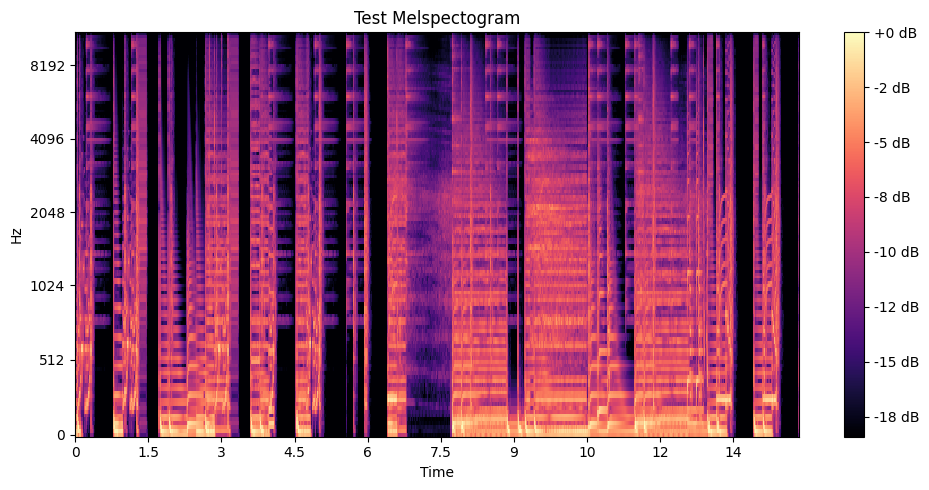

In [8]:
one_arbitrary_sample = 0
spectogram = X_train[one_arbitrary_sample]
genre = np.argmax(y_train[one_arbitrary_sample])
print(reverse_map[genre])     # Reverse Map: Number to Label

plt.figure(figsize=(10, 5))
librosa.display.specshow(spectogram.T, y_axis='mel', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Test Melspectogram')
plt.tight_layout()

##### Question 1 (10 points)

Create a few mel-spectograms samples for each genre. What are some visual differences between the genres? Are there similarities? What are some unique features for each genre that we might be able to use for classification?

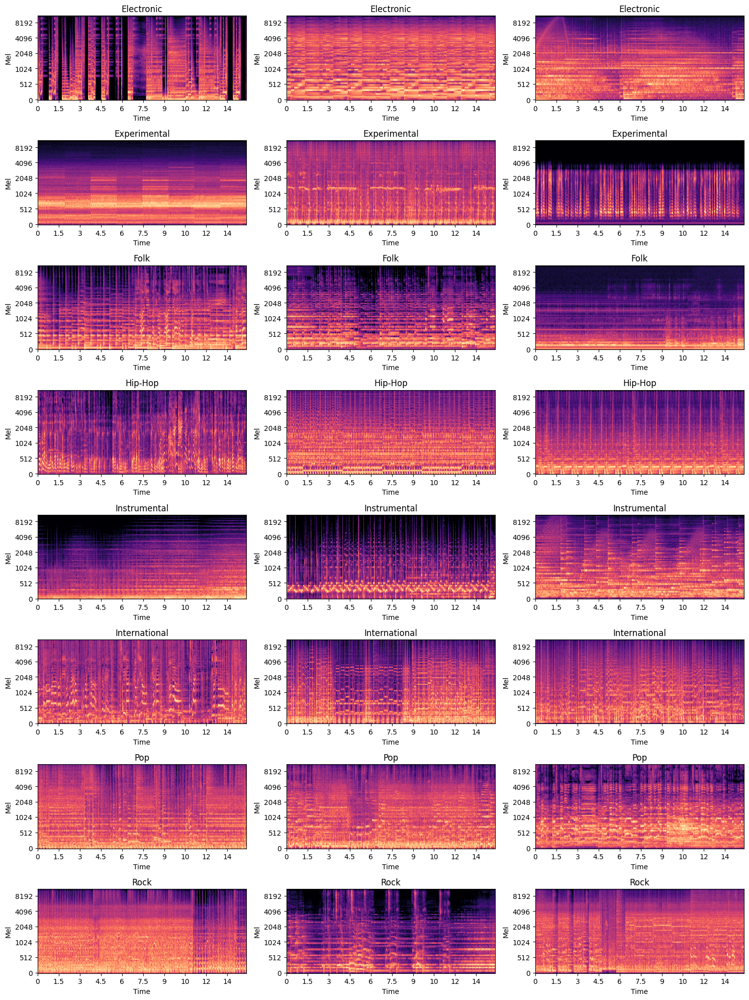

In [9]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Define the genres
genres = ['Electronic', 'Experimental', 'Folk', 'Hip-Hop',
          'Instrumental', 'International', 'Pop', 'Rock']

# Create a dictionary to store the mel-spectrograms for each genre
mel_spectrograms = {}
for genre in genres:
  mel_spectrograms[genre] = []

# Loop through the training data and store the mel-spectrograms for each genre
for i in range(len(y_train)):
  genre_index = np.argmax(y_train[i])
  genre_label = reverse_map[genre_index]
  if genre_label in genres:
    mel_spectrograms[genre_label].append(X_train[i])

# Plot a few mel-spectrograms for each genre
fig, axes = plt.subplots(nrows=len(genres), ncols=3, figsize=(15, 20))
for i, genre in enumerate(genres):
  for j in range(3):
    librosa.display.specshow(mel_spectrograms[genre][j].T, y_axis='mel', x_axis='time', ax=axes[i, j])
    axes[i, j].set_title(genre)
    axes[i, j].set_xlabel('Time')
    axes[i, j].set_ylabel('Mel')

plt.tight_layout()
plt.show()

``` Your response here ```

**Visual Differences**

* **Texture**: Electronic and Hip-Hop genres often exhibit a more uniform and repetitive texture, reflecting the electronic instruments and rhythmic patterns. In contrast, genres like Experimental, Folk, and International can have a more diverse and less predictable texture, reflecting the use of acoustic instruments and complex rhythms.

* **Frequency Distribution**: Rock and Pop genres typically have a stronger presence of higher frequencies, likely due to electric guitars and drums. Instrumental genres could have a more balanced distribution across frequencies due to the incorporation of various musical instruments. Electronic music might show concentrated bands of energy at specific frequencies, reflecting synthesized sounds.

* **Temporal Structure**: Hip-hop music might exhibit clear rhythmic patterns and percussive elements in the spectrogram. Rock and Pop music might show more gradual transitions between sections. Instrumental music can have distinct melodic and harmonic movements.

**Similarities**

* **Harmonic Content**: Pop & Rock, and Electronic & Hip-Hop may share similar harmonic progressions and frequency patterns.

* **Dynamic Range**: Electronic & Hip-Hop, and Rock & Metal often have wider dynamic ranges and intensity variations.

* **Rhythmic Patterns**: EDM & Hip-Hop, and Rock & Pop may exhibit similar rhythmic patterns and beat structures.

* **Timbral Characteristics**: Folk & Country, and Classical & Jazz may share overlapping timbral features and textures.

* **Overall Energy Level**: Rock & Metal, and EDM & Pop can have comparable energy levels and spectrographic features.

**Unique Features for Classification**

* **Electronic**: Strong vertical lines (often regular) might indicate electronic instruments and synthesized sounds. Look for repetitive patterns and concentrated frequency bands.

* **Experimental**: Unique and unpredictable patterns, often with a broader range of frequencies and less repetitive structures.

* **Folk**: Acoustic instruments would likely be prominent, potentially having more variations and less uniformity compared to Electronic or Hip-Hop.

* **Hip-Hop**: Mel-spectrograms might show strong rhythmic patterns and percussive elements, reflecting rhythmic emphasis in this genre.

* **Instrumental**: A more balanced frequency distribution, reflecting various instruments in the absence of vocals.

* **International**: May exhibit unique textures, rhythms, and melodic structures specific to a particular region.

* **Pop**: Strong melodic elements with predictable song structures could be reflected in the spectrograms.

* **Rock**: Mel-spectrograms might exhibit significant energy in higher frequencies, potentially representing electric guitars or drums.

### Convolution Layer

A convolution is a kernel (a matrix of weights; also reffered to as a mask) that is applied across an image to extract spatial information by factoring each point's neighbors.  

Classical image processing uses custom kernels that can extract key features that can be used for problems like edge detection. Refer to this Wiki article for a few examples.
https://en.wikipedia.org/wiki/Kernel_(image_processing)

In deep learning, we build a model to learn more complicated kernels that can extract more specialized information.

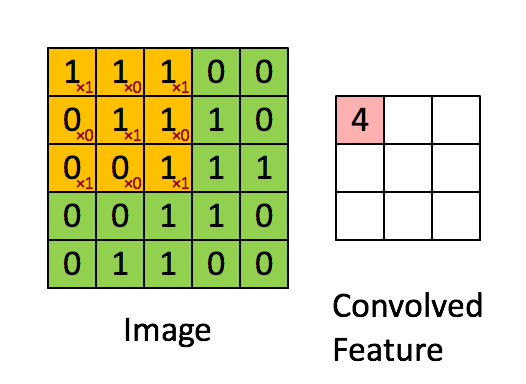

##### Question 2 (10 points)

Given a convolution layer with $f$ filters, ($k_x$ x $k_y$) kernel, and ($s_x$ x $s_y$) stride, what is the output dimension with/without padding (ie "valid" vs "same") on an ($n_x$ x $n_y$) image?

Please refer to the official keras documentation (https://keras.io/api/layers/convolution_layers/convolution2d/)

``` Your response here ```<br>
**padding**: string, either "valid" or "same" (case-insensitive). "valid" means no padding. "same" results in padding evenly to the left/right or up/down of the input. When padding="same" and strides=1, the output has the same size as the input.

**Without Padding ("valid")**

In "valid" padding, no padding is applied, and the kernel only slides over positions where it fits entirely within the input. The output dimensions are calculated as:

Output width = floor((nx - kx) / sx) + 1

Output height = floor((ny - ky) / sy) + 1

The output shape is (Output height,Output width,f).


**With Padding ("same")**

In "same" padding. The output dimensions are:

Output width = ceil(nx / sx)

Output height = ceil(ny / sy)

The output shape is (Output height,Output width,f).

Note: When padding="same" and strides=1, the output has the same size as the input.

### Pooling Layer

A pool is a very similar to a convolution layer. It is filter that is applied across the output of the convolution layer to reduce dimensionality and mitigate overfitting by summarizing the convolution results.

For this demonstration, we will be using max pooling.

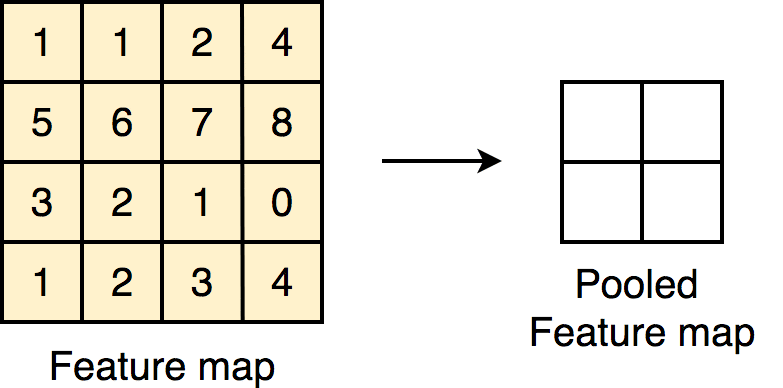

##### Question 3 (10 points)

Given a pooling layer ($p_x$ x $p_y$) pool and ($s_x$ x $s_y$) stride, what is the output dimension with/without padding (ie "valid" vs "same") on an ($n_x$ x $n_y$) image?

Please refer to the official keras documentation (https://keras.io/api/layers/pooling_layers/max_pooling2d/)

``` Your response here ```<br>
Downsamples the input along its spatial dimensions (height and width) by taking the maximum value over an input window (of size defined by pool_size) for each channel of the input. The window is shifted by strides along each dimension.

The resulting output when using the "valid" padding option has a spatial shape (number of rows or columns) of:<br>
output_shape = math.floor((nx - px) / sx) + 1

output_shape = math.floor((ny - py) / sy) + 1
(when input_shape >= pool_size)

The resulting output shape when using the "same" padding option is:<br>
 output_shape = math.floor((nx - 1) / sx) + 1

output_shape = math.floor((ny - 1) / sy) + 1

### Now we will implement our model
#### Parallel CNN - RNN Model

Since music has temporal features, it is obvious to use a RNN, but we saw from the melspectograms that there are also visual features that a CNN might learn. Our motivation is to try to combine both models through concatenation to extract both temporal and spatial features.

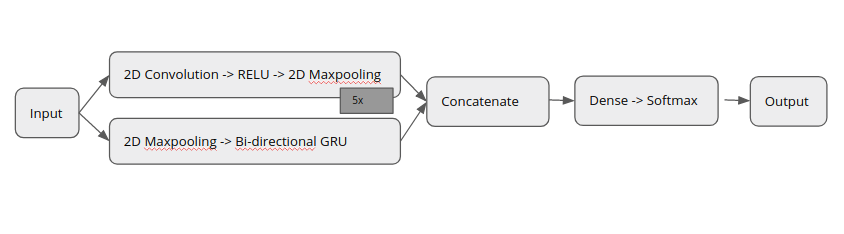

In [10]:
class DataGenerator(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        self.x = x_set
        self.y = y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / self.batch_size))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]

        return np.expand_dims(batch_x, axis=-1), batch_y

batch_size = 64

train_generator = DataGenerator(X_train, y_train, batch_size)
valid_generator = DataGenerator(X_valid, y_valid, batch_size)

In [11]:
# The number of possible predicted classes
num_classes = 8

# The number of features in a single data input (frequency components)
n_features = X_train.shape[2]

# The length of an input sample (in seconds)
n_time = X_train.shape[1]

In [12]:
def conv_recurrent_model_build(model_input):
    print('Building model...')
    layer = model_input

    ### Convolutional blocks
    conv_1 = Conv2D(filters=16, kernel_size=(3,1), strides=1,
                    padding='valid', activation='relu', name='conv_1')(layer)
    pool_1 = MaxPooling2D((2,2))(conv_1)

    # Your Code Here
    conv_2 = Conv2D(filters=32, kernel_size=(3, 1), strides=1,
                    padding='valid', activation='relu', name='conv_2')(pool_1)
    pool_2 = MaxPooling2D((2, 2))(conv_2)

    conv_3 = Conv2D(filters=64, kernel_size=(3, 1), strides=1,
                    padding='valid', activation='relu', name='conv_3')(pool_2)
    pool_3 = MaxPooling2D((2, 2))(conv_3)

    conv_4 = Conv2D(filters=128, kernel_size=(3, 1), strides=1,
                    padding='valid', activation='relu', name='conv_4')(pool_3)
    pool_4 = MaxPooling2D((2, 2))(conv_4)

    conv_5 = Conv2D(filters=256, kernel_size=(3, 1), strides=1,
                    padding='valid', activation='relu', name='conv_5')(pool_4)
    pool_5 = MaxPooling2D((2, 2))(conv_5)
    # ADD YOUR CODE HERE

    flatten1 = Flatten()(pool_5)

    ### Recurrent Block
    lstm_count = 64

    # Pooling layer
    pool_lstm1 = MaxPooling2D((4,2), name = 'pool_lstm')(layer)

    # Embedding layer
    squeezed = Lambda(lambda x: tf.squeeze(x, axis=-1), output_shape=lambda s: (s[0], s[1], s[2]))(pool_lstm1)

    # Bidirectional GRU
    lstm = Bidirectional(GRU(lstm_count))(squeezed)  #default merge mode is concat

    # Concat Output
    concat = concatenate([flatten1, lstm], axis=-1, name ='concat')

    ## Softmax Output
    output = Dense(num_classes, activation = 'softmax', name='preds')(concat)

    model_output = output
    model = Model(model_input, model_output)

    opt = RMSprop(learning_rate=0.0005)  # Optimizer
    model.compile(
            loss='categorical_crossentropy',
            optimizer=opt,
            metrics=['accuracy']
        )

    return model

##### Question 4 (20 points)

Fill in the missing code for the cell above and implement the four missing convolution layers interwoven with max pooling layers. When you run the commented-out code below, your output should match the image below. Use the first convolution and pooling layer as an example.

All of the convolution layers should have the same kernel size, stride, padding, and activation function.

If you are stuck, this article should help:
https://towardsdatascience.com/how-to-calculate-the-number-of-parameters-in-keras-models-710683dae0ca



In [13]:
n_frequency = 128
n_frames = 640
input_shape = (n_frames, n_frequency, 1)
model_input = Input(input_shape, name='input')
model = conv_recurrent_model_build(model_input)

Building model...


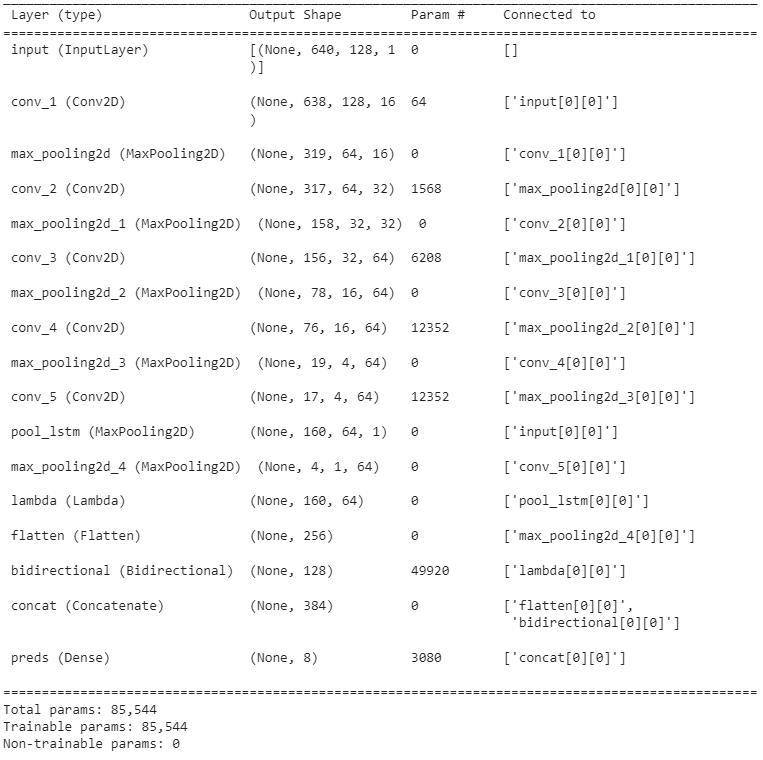

Hint: use print(model.summary()) to check if your model satisfies the requirements of the specifications above.

In [14]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)        │ (None, 640, 128, 1)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_1 (Conv2D)           │ (None, 638, 128, 16)   │             64 │ input[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 319, 64, 16)    │              0 │ conv_1[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_2 (Conv2D)           │ (None, 317, 64, 32)    │          1,568 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 158, 32, 32)    │              0 │ conv_2[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_3 (Conv2D)           │ (None, 156, 32, 64)    │          6,208 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 78, 16, 64)     │              0 │ conv_3[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_4 (Conv2D)           │ (None, 76, 16, 128)    │         24,704 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 38, 8, 128)     │              0 │ conv_4[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_5 (Conv2D)           │ (None, 36, 8, 256)     │         98,560 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool_lstm (MaxPooling2D)  │ (None, 160, 64, 1)     │              0 │ input[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 18, 4, 256)     │              0 │ conv_5[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 160, 64)        │              0 │ pool_lstm[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 18432)          │              0 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional             │ (None, 128)            │         49,920 │ lambda[0][0]           │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concat (Concatenate)      │ (None, 18560)          │              0 │ flatten[0][0],         │
│                           │                        │                │ bidirectional[0][0]    │
├──────────────────────

 Total params: 329,512 (1.26 MB)

 Trainable params: 329,512 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

In [15]:
def train_model_with_generators(train_generator, valid_generator, steps_per_epoch, validation_steps):

    input_shape = (n_frames, n_frequency, 1)
    model_input = Input(input_shape, name='input')

    model = conv_recurrent_model_build(model_input)

    checkpoint_callback = ModelCheckpoint('./models/parallel/weights.best.keras', monitor='val_accuracy', verbose=1,
                                          save_best_only=True, mode='max')

    reducelr_callback = ReduceLROnPlateau(
                monitor='val_accuracy', factor=0.5, patience=10, min_delta=0.01,
                verbose=1
            )

    callbacks_list = [checkpoint_callback, reducelr_callback]

    # Fit the model using the generator
    print('Training...')
    history = model.fit(train_generator,
                        steps_per_epoch=steps_per_epoch,
                        epochs=3,
                        validation_data=valid_generator,
                        validation_steps=validation_steps,
                        verbose=1,
                        callbacks=callbacks_list)

    return model, history

In [16]:
def show_summary_stats(history):
    # List all data in history
    print(history.history.keys())

    # Summarize history for accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # Summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

In [17]:
# model, history = train_model(X_train, y_train, X_valid, y_valid)
epochs = 3
steps_per_epoch = len(train_generator) // epochs
validation_steps = len(valid_generator) // epochs

model, history = train_model_with_generators(train_generator, valid_generator, steps_per_epoch, validation_steps)

Building model...
Training...
Epoch 1/3


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.1437 - loss: 2.6573
Epoch 1: val_accuracy improved from -inf to 0.20703, saving model to ./models/parallel/weights.best.keras
33/33 ━━━━━━━━━━━━━━━━━━━━ 181s 5s/step - accuracy: 0.1443 - loss: 2.6452 - val_accuracy: 0.2070 - val_loss: 2.0128 - learning_rate: 5.0000e-04
Epoch 2/3
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.2060 - loss: 2.0012
Epoch 2: val_accuracy improved from 0.20703 to 0.34375, saving model to ./models/parallel/weights.best.keras
33/33 ━━━━━━━━━━━━━━━━━━━━ 160s 5s/step - accuracy: 0.2067 - loss: 2.0008 - val_accuracy: 0.3438 - val_loss: 1.8779 - learning_rate: 5.0000e-04
Epoch 3/3
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.3181 - loss: 1.8876
Epoch 3: val_accuracy did not improve from 0.34375
33/33 ━━━━━━━━━━━━━━━━━━━━ 160s 5s/step - accuracy: 0.3174 - loss: 1.8875 - val_accuracy: 0.2305 - val_loss: 1.8554 - learning_rate: 5.0000e-04


### Results


dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss', 'learning_rate'])


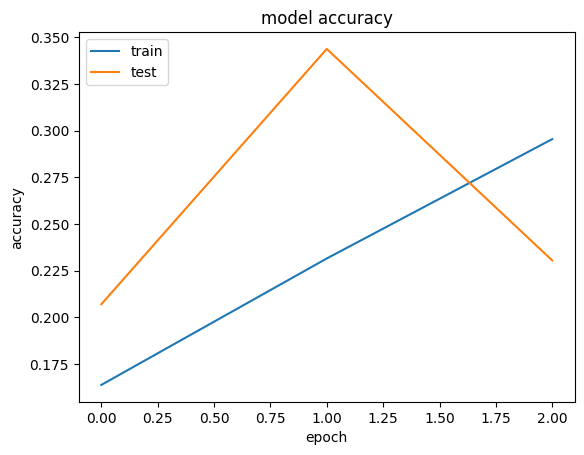

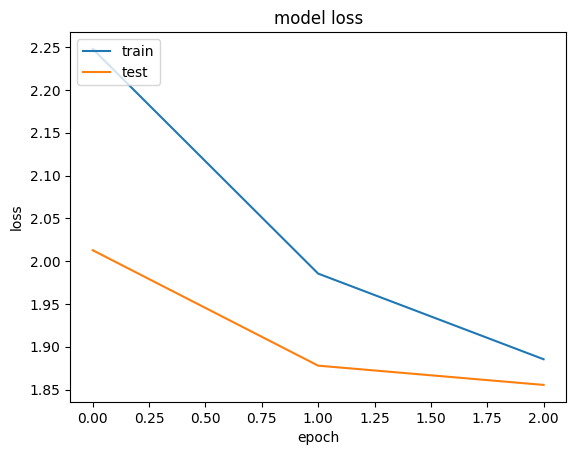

In [18]:
show_summary_stats(history)

In [19]:
from sklearn.metrics import classification_report

y_true = np.argmax(y_valid, axis = 1)
X_valid = np.expand_dims(X_valid, axis = -1)
y_pred = model.predict(X_valid)
y_pred = np.argmax(y_pred, axis=1)
labels = [0,1,2,3,4,5,6,7]
target_names = dict_genres.keys()

print(y_true.shape, y_pred.shape)
print(classification_report(y_true, y_pred, target_names=target_names))

25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 834ms/step
(800,) (800,)
               precision    recall  f1-score   support

   Electronic       0.44      0.32      0.37       100
 Experimental       0.19      0.37      0.26       100
         Folk       0.50      0.17      0.25       100
      Hip-Hop       0.42      0.20      0.27       100
 Instrumental       0.22      0.16      0.18       100
International       0.56      0.05      0.09       100
          Pop       0.14      0.28      0.19       100
         Rock       0.40      0.70      0.51       100

     accuracy                           0.28       800
    macro avg       0.36      0.28      0.27       800
 weighted avg       0.36      0.28      0.27       800



##### Question 5 (10 points)

Briefly describe, in a few sentences, the training results. Does the model perform well? What can we learn from the train and test loss curves? Is the model overfitted? What do the metrics tell us?

*Note that you can increase the number of epochs to get a better picture of the models performance


``` Your response here ```<br>
The answer is based on my previous runs<br>
**3 Epoch**
<br>
**Train-Test Loss Curves**:
* Both training and validation losses are decreasing steadily, indicating that the model is learning and not overfitting (at least within 3 epochs)
* Validation accuracy is following the same trend as training accuracy, which supports the absence of overfitting in this limited epoch range.

**Performance Analysis**:
* The low accuracy (around 27%) suggests that the model struggles to learn complex features for this task within 3 epochs. A larger number of epochs might allow the model to converge better.

* Class imbalances or challenging features (e.g., genres like Instrumental) may require targeted improvements like better feature extraction or class-weighted loss functions.

**Classification Insights**

* Genres such as Folk and Rock have higher performance, suggesting that their features are more distinct or better captured by the model.

* Poor performance on genres like Instrumental and Pop may indicate overlapping features with other classes or insufficient representation.

**20 Epochs**<br>

The model shows signs of learning, but the fluctuations in validation accuracy/loss indicate instability. This suggests potential issues like learning rate or overfitting to the training data.

**Overall Accuracy**:
* Training Accuracy: 34.37%
* Validation Accuracy: 31.37% (peaked at Epoch 13, ended at 25.50%)
the validation accuracy only saw marginal improvement beyond 3 epochs, peaking at Epoch 13 and then fluctuating. This indicates the model might be overfitting or struggling with generalization.

**Best Performing Genres**
* Rock: F1-score = 0.50 (recall = 66%), suggesting the model captures features of this genre relatively well.
* Folk: F1-score = 0.32 (recall = 78%), indicating good sensitivity but poor precision

**Worst Performing Genres**:
* Experimental: No predictions made (precision = 0), highlighting a failure to learn distinctive features
* Pop and International: Poor precision and recall (F1-scores = 0.06 and 0.11).

The high recall for Folk and Rock suggests these genres are easier to distinguish, likely due to more distinct or abundant features. and Genres like Experimental, Pop, and International remain poorly classified, requiring additional focus.

**Key Insights**:
* Early Improvements: By Epoch 3, the model had already learned basic patterns in the data, especially for certain genres like Rock and Folk.
* Marginal Gains Beyond Epoch 3: Additional epochs led to better training accuracy and some performance gains for genres like Rock, but generalization (validation accuracy) did not improve significantly.
* Overfitting Signs: The model's performance beyond Epoch 13 suggests it is fitting the training data too closely without learning features that generalize well to unseen data.


### Visualizing the Model

1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


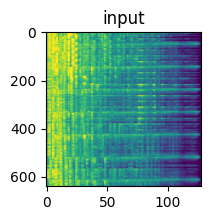

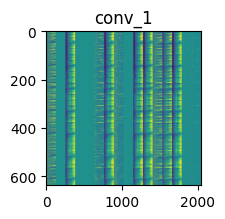

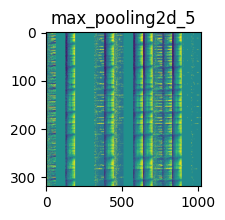

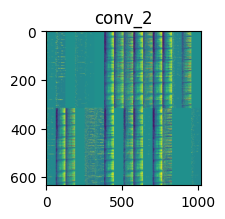

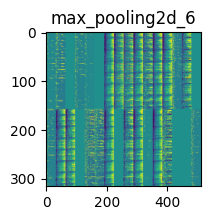

...

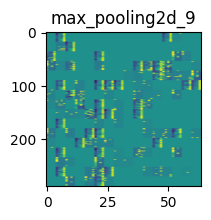

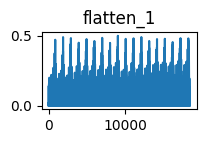

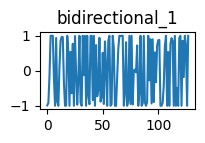

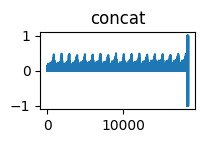

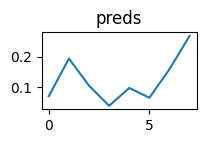

In [20]:
# Extract activations using tf.keras
def get_activations(model, inputs, layer_names=None):
    if layer_names is None:
        layer_names = [layer.name for layer in model.layers]
    outputs = [model.get_layer(name).output for name in layer_names]
    activations_model = Model(inputs=model.input, outputs=outputs)
    activations = activations_model.predict(inputs)
    return {name: activation for name, activation in zip(layer_names, activations)}

one_arbitrary_sample = 0
X_valid_exp = np.expand_dims(X_valid, axis=-1)
sample = X_valid_exp[one_arbitrary_sample:one_arbitrary_sample+1]
genre = np.argmax(y_valid[one_arbitrary_sample])
print(genre)
activations = get_activations(model, sample)

# Display activations
def display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(20, 10)):
    for layer_name, activation in activations.items():
        if len(activation.shape) == 4:  # Conv layers
            n_features = activation.shape[-1]
            size_y, size_x = activation.shape[1], activation.shape[2]
            n_cols = n_features // 16 if n_features >= 16 else 1
            display_grid = np.zeros((size_y * n_cols, size_x * min(16, n_features)))
            for col in range(n_cols):
                for row in range(min(16, n_features)):
                    channel_image = activation[0, :, :, col * 16 + row]
                    channel_image -= channel_image.mean()
                    channel_image /= (channel_image.std() + 1e-5)
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size_y : (col + 1) * size_y, row * size_x : (row + 1) * size_x] = channel_image
            scale = 1. / size_y
            plt.figure(figsize=(fig_size[0], fig_size[1]))
            plt.title(layer_name)
            plt.grid(False)
            plt.imshow(display_grid, aspect='auto', cmap=cmap)
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()
        elif len(activation.shape) == 2:  # Dense layers
            plt.figure(figsize=(fig_size[0], fig_size[1] // 2))
            plt.title(layer_name)
            plt.grid(False)
            plt.plot(activation[0])
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()

# Now use the updated function
display_activations(activations, fig_size=(2, 2))


5
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


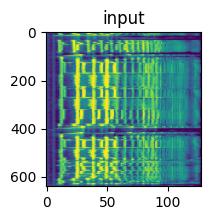

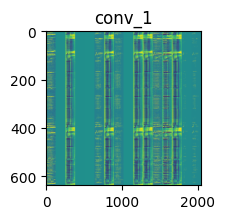

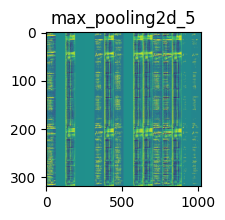

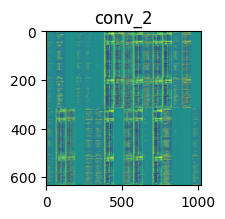

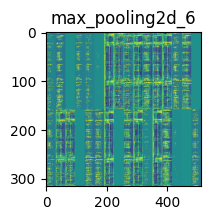

...

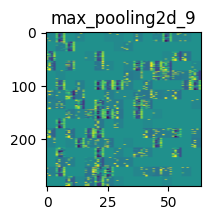

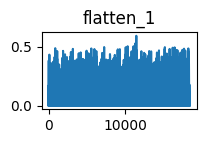

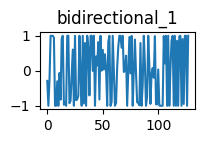

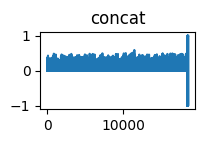

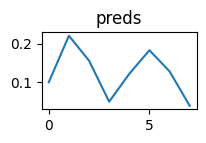

In [21]:
# Extract activations using tf.keras
def get_activations(model, inputs, layer_names=None):
    if layer_names is None:
        layer_names = [layer.name for layer in model.layers]
    outputs = [model.get_layer(name).output for name in layer_names]
    activations_model = Model(inputs=model.input, outputs=outputs)
    activations = activations_model.predict(inputs)
    return {name: activation for name, activation in zip(layer_names, activations)}

one_arbitrary_sample = 1
X_valid_exp = np.expand_dims(X_valid, axis=-1)
sample = X_valid_exp[one_arbitrary_sample:one_arbitrary_sample+1]
genre = np.argmax(y_valid[one_arbitrary_sample])
print(genre)
activations = get_activations(model, sample)

# Display activations
def display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(20, 10)):
    for layer_name, activation in activations.items():
        if len(activation.shape) == 4:  # Conv layers
            n_features = activation.shape[-1]
            size_y, size_x = activation.shape[1], activation.shape[2]
            n_cols = n_features // 16 if n_features >= 16 else 1
            display_grid = np.zeros((size_y * n_cols, size_x * min(16, n_features)))
            for col in range(n_cols):
                for row in range(min(16, n_features)):
                    channel_image = activation[0, :, :, col * 16 + row]
                    channel_image -= channel_image.mean()
                    channel_image /= (channel_image.std() + 1e-5)
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size_y : (col + 1) * size_y, row * size_x : (row + 1) * size_x] = channel_image
            scale = 1. / size_y
            plt.figure(figsize=(fig_size[0], fig_size[1]))
            plt.title(layer_name)
            plt.grid(False)
            plt.imshow(display_grid, aspect='auto', cmap=cmap)
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()
        elif len(activation.shape) == 2:  # Dense layers
            plt.figure(figsize=(fig_size[0], fig_size[1] // 2))
            plt.title(layer_name)
            plt.grid(False)
            plt.plot(activation[0])
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()

# Now use the updated function
display_activations(activations, fig_size=(2, 2))


0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


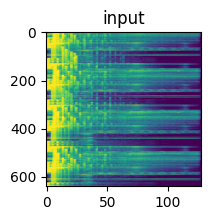

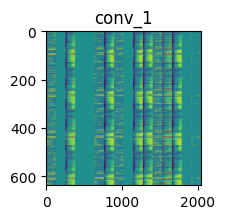

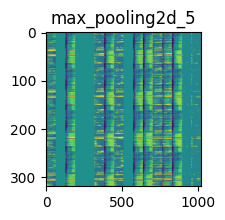

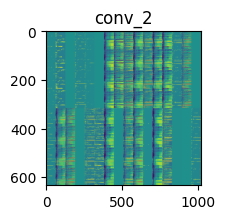

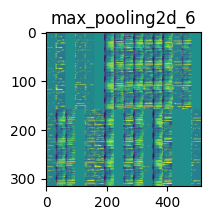

...

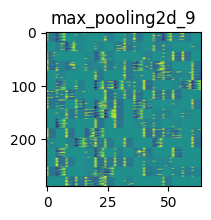

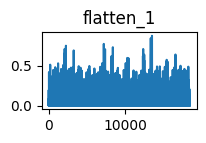

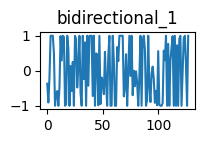

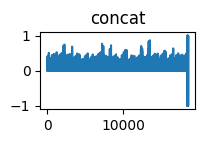

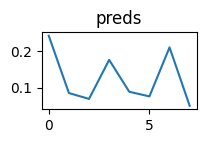

In [22]:
# Extract activations using tf.keras
def get_activations(model, inputs, layer_names=None):
    if layer_names is None:
        layer_names = [layer.name for layer in model.layers]
    outputs = [model.get_layer(name).output for name in layer_names]
    activations_model = Model(inputs=model.input, outputs=outputs)
    activations = activations_model.predict(inputs)
    return {name: activation for name, activation in zip(layer_names, activations)}

one_arbitrary_sample = 2
X_valid_exp = np.expand_dims(X_valid, axis=-1)
sample = X_valid_exp[one_arbitrary_sample:one_arbitrary_sample+1]
genre = np.argmax(y_valid[one_arbitrary_sample])
print(genre)
activations = get_activations(model, sample)

# Display activations
def display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(20, 10)):
    for layer_name, activation in activations.items():
        if len(activation.shape) == 4:  # Conv layers
            n_features = activation.shape[-1]
            size_y, size_x = activation.shape[1], activation.shape[2]
            n_cols = n_features // 16 if n_features >= 16 else 1
            display_grid = np.zeros((size_y * n_cols, size_x * min(16, n_features)))
            for col in range(n_cols):
                for row in range(min(16, n_features)):
                    channel_image = activation[0, :, :, col * 16 + row]
                    channel_image -= channel_image.mean()
                    channel_image /= (channel_image.std() + 1e-5)
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size_y : (col + 1) * size_y, row * size_x : (row + 1) * size_x] = channel_image
            scale = 1. / size_y
            plt.figure(figsize=(fig_size[0], fig_size[1]))
            plt.title(layer_name)
            plt.grid(False)
            plt.imshow(display_grid, aspect='auto', cmap=cmap)
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()
        elif len(activation.shape) == 2:  # Dense layers
            plt.figure(figsize=(fig_size[0], fig_size[1] // 2))
            plt.title(layer_name)
            plt.grid(False)
            plt.plot(activation[0])
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()

# Now use the updated function
display_activations(activations, fig_size=(2, 2))


3


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


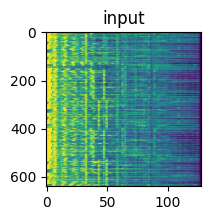

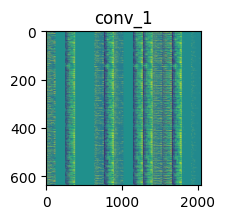

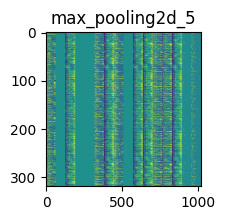

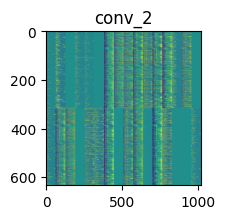

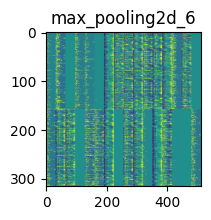

...

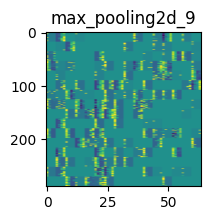

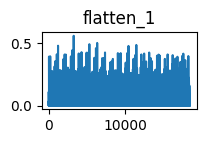

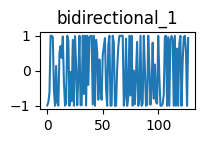

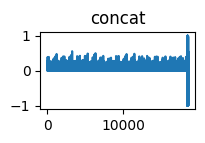

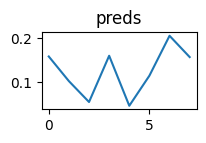

In [23]:
# Extract activations using tf.keras
def get_activations(model, inputs, layer_names=None):
    if layer_names is None:
        layer_names = [layer.name for layer in model.layers]
    outputs = [model.get_layer(name).output for name in layer_names]
    activations_model = Model(inputs=model.input, outputs=outputs)
    activations = activations_model.predict(inputs)
    return {name: activation for name, activation in zip(layer_names, activations)}

one_arbitrary_sample = 3
X_valid_exp = np.expand_dims(X_valid, axis=-1)
sample = X_valid_exp[one_arbitrary_sample:one_arbitrary_sample+1]
genre = np.argmax(y_valid[one_arbitrary_sample])
print(genre)
activations = get_activations(model, sample)

# Display activations
def display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(20, 10)):
    for layer_name, activation in activations.items():
        if len(activation.shape) == 4:  # Conv layers
            n_features = activation.shape[-1]
            size_y, size_x = activation.shape[1], activation.shape[2]
            n_cols = n_features // 16 if n_features >= 16 else 1
            display_grid = np.zeros((size_y * n_cols, size_x * min(16, n_features)))
            for col in range(n_cols):
                for row in range(min(16, n_features)):
                    channel_image = activation[0, :, :, col * 16 + row]
                    channel_image -= channel_image.mean()
                    channel_image /= (channel_image.std() + 1e-5)
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size_y : (col + 1) * size_y, row * size_x : (row + 1) * size_x] = channel_image
            scale = 1. / size_y
            plt.figure(figsize=(fig_size[0], fig_size[1]))
            plt.title(layer_name)
            plt.grid(False)
            plt.imshow(display_grid, aspect='auto', cmap=cmap)
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()
        elif len(activation.shape) == 2:  # Dense layers
            plt.figure(figsize=(fig_size[0], fig_size[1] // 2))
            plt.title(layer_name)
            plt.grid(False)
            plt.plot(activation[0])
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()

# Now use the updated function
display_activations(activations, fig_size=(2, 2))


3


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


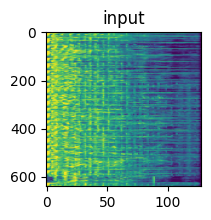

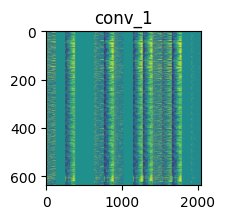

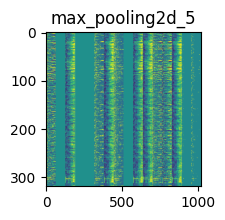

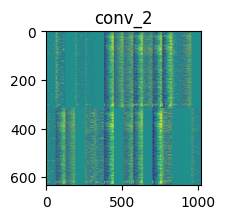

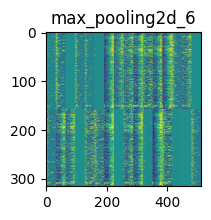

...

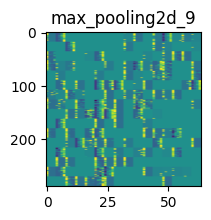

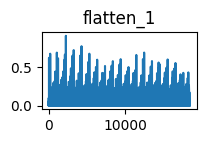

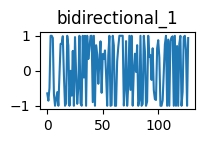

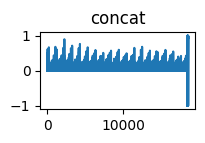

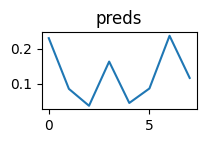

In [24]:
# Extract activations using tf.keras
def get_activations(model, inputs, layer_names=None):
    if layer_names is None:
        layer_names = [layer.name for layer in model.layers]
    outputs = [model.get_layer(name).output for name in layer_names]
    activations_model = Model(inputs=model.input, outputs=outputs)
    activations = activations_model.predict(inputs)
    return {name: activation for name, activation in zip(layer_names, activations)}

one_arbitrary_sample = 4
X_valid_exp = np.expand_dims(X_valid, axis=-1)
sample = X_valid_exp[one_arbitrary_sample:one_arbitrary_sample+1]
genre = np.argmax(y_valid[one_arbitrary_sample])
print(genre)
activations = get_activations(model, sample)

# Display activations
def display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(20, 10)):
    for layer_name, activation in activations.items():
        if len(activation.shape) == 4:  # Conv layers
            n_features = activation.shape[-1]
            size_y, size_x = activation.shape[1], activation.shape[2]
            n_cols = n_features // 16 if n_features >= 16 else 1
            display_grid = np.zeros((size_y * n_cols, size_x * min(16, n_features)))
            for col in range(n_cols):
                for row in range(min(16, n_features)):
                    channel_image = activation[0, :, :, col * 16 + row]
                    channel_image -= channel_image.mean()
                    channel_image /= (channel_image.std() + 1e-5)
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size_y : (col + 1) * size_y, row * size_x : (row + 1) * size_x] = channel_image
            scale = 1. / size_y
            plt.figure(figsize=(fig_size[0], fig_size[1]))
            plt.title(layer_name)
            plt.grid(False)
            plt.imshow(display_grid, aspect='auto', cmap=cmap)
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()
        elif len(activation.shape) == 2:  # Dense layers
            plt.figure(figsize=(fig_size[0], fig_size[1] // 2))
            plt.title(layer_name)
            plt.grid(False)
            plt.plot(activation[0])
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()

# Now use the updated function
display_activations(activations, fig_size=(2, 2))


5
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 761ms/step


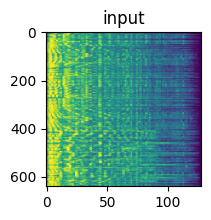

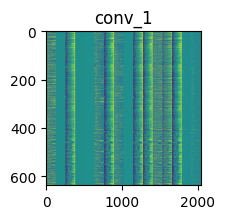

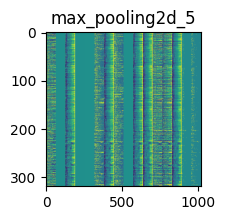

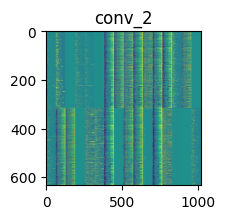

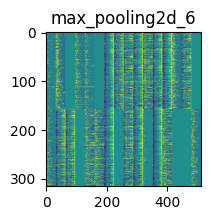

...

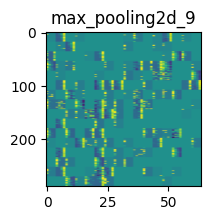

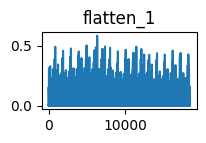

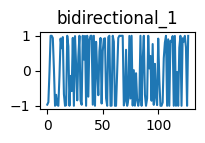

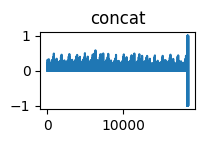

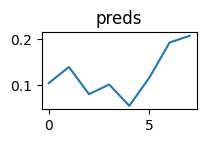

In [25]:
# Extract activations using tf.keras
def get_activations(model, inputs, layer_names=None):
    if layer_names is None:
        layer_names = [layer.name for layer in model.layers]
    outputs = [model.get_layer(name).output for name in layer_names]
    activations_model = Model(inputs=model.input, outputs=outputs)
    activations = activations_model.predict(inputs)
    return {name: activation for name, activation in zip(layer_names, activations)}

one_arbitrary_sample = 5
X_valid_exp = np.expand_dims(X_valid, axis=-1)
sample = X_valid_exp[one_arbitrary_sample:one_arbitrary_sample+1]
genre = np.argmax(y_valid[one_arbitrary_sample])
print(genre)
activations = get_activations(model, sample)

# Display activations
def display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(20, 10)):
    for layer_name, activation in activations.items():
        if len(activation.shape) == 4:  # Conv layers
            n_features = activation.shape[-1]
            size_y, size_x = activation.shape[1], activation.shape[2]
            n_cols = n_features // 16 if n_features >= 16 else 1
            display_grid = np.zeros((size_y * n_cols, size_x * min(16, n_features)))
            for col in range(n_cols):
                for row in range(min(16, n_features)):
                    channel_image = activation[0, :, :, col * 16 + row]
                    channel_image -= channel_image.mean()
                    channel_image /= (channel_image.std() + 1e-5)
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size_y : (col + 1) * size_y, row * size_x : (row + 1) * size_x] = channel_image
            scale = 1. / size_y
            plt.figure(figsize=(fig_size[0], fig_size[1]))
            plt.title(layer_name)
            plt.grid(False)
            plt.imshow(display_grid, aspect='auto', cmap=cmap)
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()
        elif len(activation.shape) == 2:  # Dense layers
            plt.figure(figsize=(fig_size[0], fig_size[1] // 2))
            plt.title(layer_name)
            plt.grid(False)
            plt.plot(activation[0])
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()

# Now use the updated function
display_activations(activations, fig_size=(2, 2))


4
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


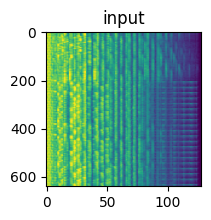

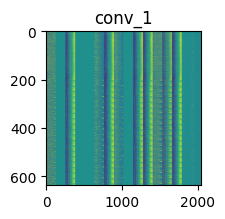

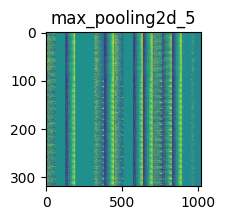

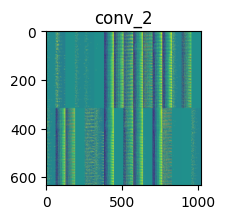

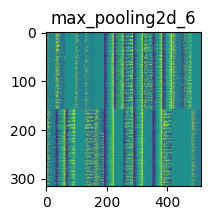

...

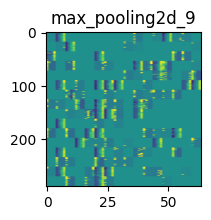

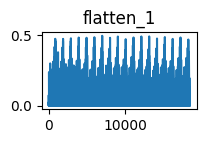

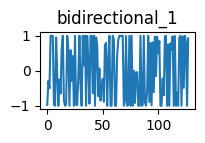

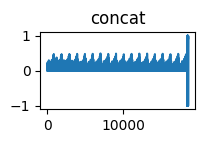

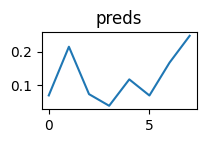

In [26]:
# Extract activations using tf.keras
def get_activations(model, inputs, layer_names=None):
    if layer_names is None:
        layer_names = [layer.name for layer in model.layers]
    outputs = [model.get_layer(name).output for name in layer_names]
    activations_model = Model(inputs=model.input, outputs=outputs)
    activations = activations_model.predict(inputs)
    return {name: activation for name, activation in zip(layer_names, activations)}

one_arbitrary_sample = 6
X_valid_exp = np.expand_dims(X_valid, axis=-1)
sample = X_valid_exp[one_arbitrary_sample:one_arbitrary_sample+1]
genre = np.argmax(y_valid[one_arbitrary_sample])
print(genre)
activations = get_activations(model, sample)

# Display activations
def display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(20, 10)):
    for layer_name, activation in activations.items():
        if len(activation.shape) == 4:  # Conv layers
            n_features = activation.shape[-1]
            size_y, size_x = activation.shape[1], activation.shape[2]
            n_cols = n_features // 16 if n_features >= 16 else 1
            display_grid = np.zeros((size_y * n_cols, size_x * min(16, n_features)))
            for col in range(n_cols):
                for row in range(min(16, n_features)):
                    channel_image = activation[0, :, :, col * 16 + row]
                    channel_image -= channel_image.mean()
                    channel_image /= (channel_image.std() + 1e-5)
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size_y : (col + 1) * size_y, row * size_x : (row + 1) * size_x] = channel_image
            scale = 1. / size_y
            plt.figure(figsize=(fig_size[0], fig_size[1]))
            plt.title(layer_name)
            plt.grid(False)
            plt.imshow(display_grid, aspect='auto', cmap=cmap)
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()
        elif len(activation.shape) == 2:  # Dense layers
            plt.figure(figsize=(fig_size[0], fig_size[1] // 2))
            plt.title(layer_name)
            plt.grid(False)
            plt.plot(activation[0])
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()

# Now use the updated function
display_activations(activations, fig_size=(2, 2))


3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


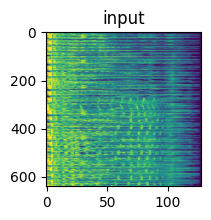

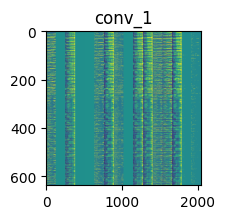

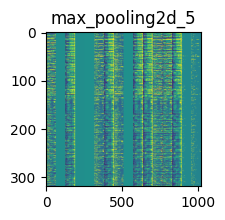

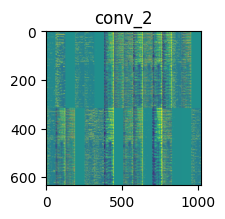

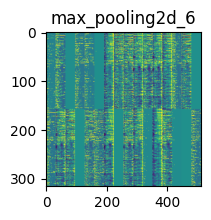

...

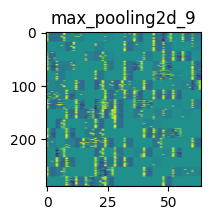

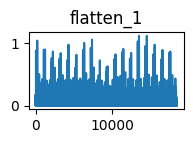

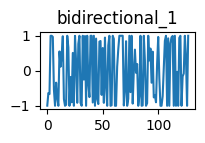

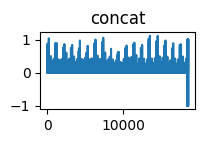

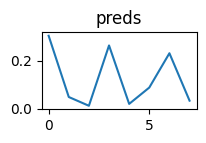

In [27]:
# Extract activations using tf.keras
def get_activations(model, inputs, layer_names=None):
    if layer_names is None:
        layer_names = [layer.name for layer in model.layers]
    outputs = [model.get_layer(name).output for name in layer_names]
    activations_model = Model(inputs=model.input, outputs=outputs)
    activations = activations_model.predict(inputs)
    return {name: activation for name, activation in zip(layer_names, activations)}

one_arbitrary_sample = 7
X_valid_exp = np.expand_dims(X_valid, axis=-1)
sample = X_valid_exp[one_arbitrary_sample:one_arbitrary_sample+1]
genre = np.argmax(y_valid[one_arbitrary_sample])
print(genre)
activations = get_activations(model, sample)

# Display activations
def display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(20, 10)):
    for layer_name, activation in activations.items():
        if len(activation.shape) == 4:  # Conv layers
            n_features = activation.shape[-1]
            size_y, size_x = activation.shape[1], activation.shape[2]
            n_cols = n_features // 16 if n_features >= 16 else 1
            display_grid = np.zeros((size_y * n_cols, size_x * min(16, n_features)))
            for col in range(n_cols):
                for row in range(min(16, n_features)):
                    channel_image = activation[0, :, :, col * 16 + row]
                    channel_image -= channel_image.mean()
                    channel_image /= (channel_image.std() + 1e-5)
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size_y : (col + 1) * size_y, row * size_x : (row + 1) * size_x] = channel_image
            scale = 1. / size_y
            plt.figure(figsize=(fig_size[0], fig_size[1]))
            plt.title(layer_name)
            plt.grid(False)
            plt.imshow(display_grid, aspect='auto', cmap=cmap)
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()
        elif len(activation.shape) == 2:  # Dense layers
            plt.figure(figsize=(fig_size[0], fig_size[1] // 2))
            plt.title(layer_name)
            plt.grid(False)
            plt.plot(activation[0])
            if save:
                plt.savefig(f"{layer_name}.png")
            plt.show()

# Now use the updated function
display_activations(activations, fig_size=(2, 2))


##### Question 6 (20 points)
Visualize the activation layers for the CNN using the code above and try a few samples for each genre. Are there any clear features? Are any of the features similar to the features you expected at the start? Are there similar or different features across genres?

``` Your response here ```<br>
**Low-level Features**: In early layers (e.g., first convolutional layers), observe general features like edges, textures, or basic frequency patterns common across genres.

**High-level Features**: In deeper layers, see more genre-specific features, such as patterns resembling harmonic structures for Folk or complex textures for Experimental.

**Similar Features Across Genres**: Genres like Rock and Pop share activation patterns related to rhythmic or harmonic structures.

**Distinct Features**: Experimental genres show sparse and scattered activations due to their unpredictable nature, while Folk might show clear harmonic activations.

##### Question 7 [20 points]

Please record a 2-5 minute video of yourself explaining questions 1 to 7.

If you are shy (or have a bad hairday) you can use filters to augment or cover your face. Please submit it as a public google drive url.